#人臉辨識＆口罩偵測演算法


---





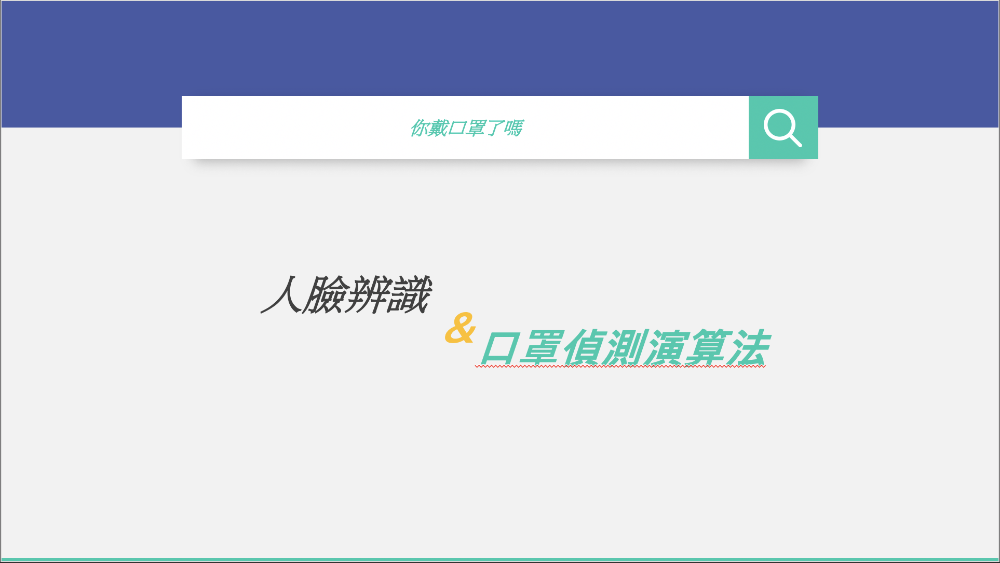

In [ ]:
from PIL import Image
pict = Image.open("ppt1.png")
pict

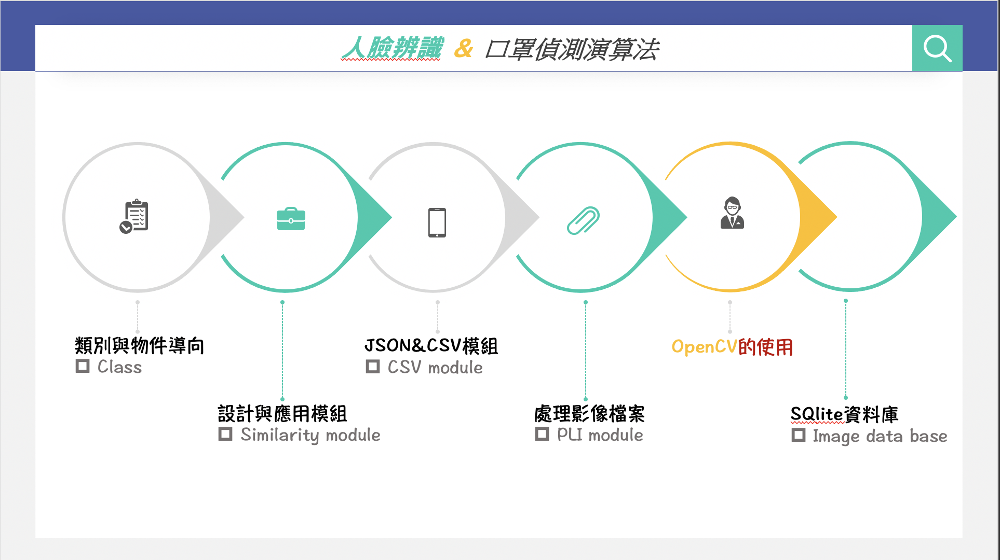

In [ ]:
from PIL import Image
pict = Image.open("ppt2.png")
pict

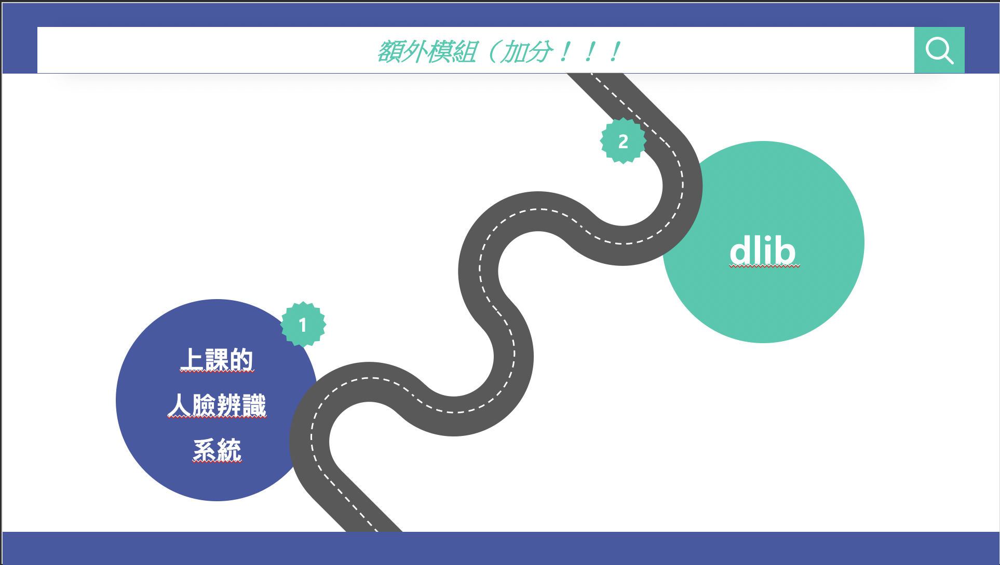

In [ ]:
from PIL import Image
pict = Image.open("ppt3.png")
pict

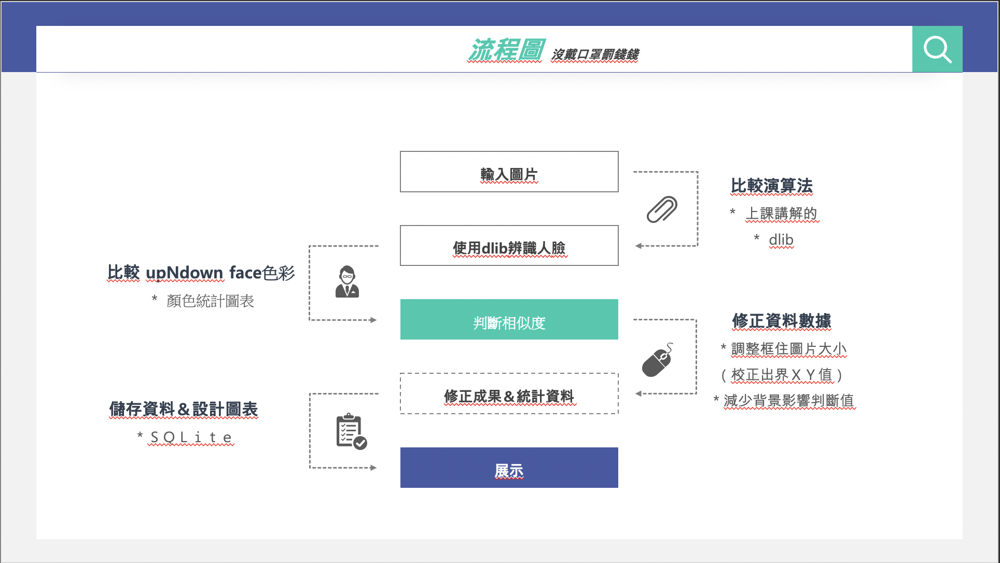

In [29]:
from PIL import Image
pict = Image.open("ppt4.png")
pict

#老師上課講解過的臉部辨識程式

<class 'cv2.CascadeClassifier'>


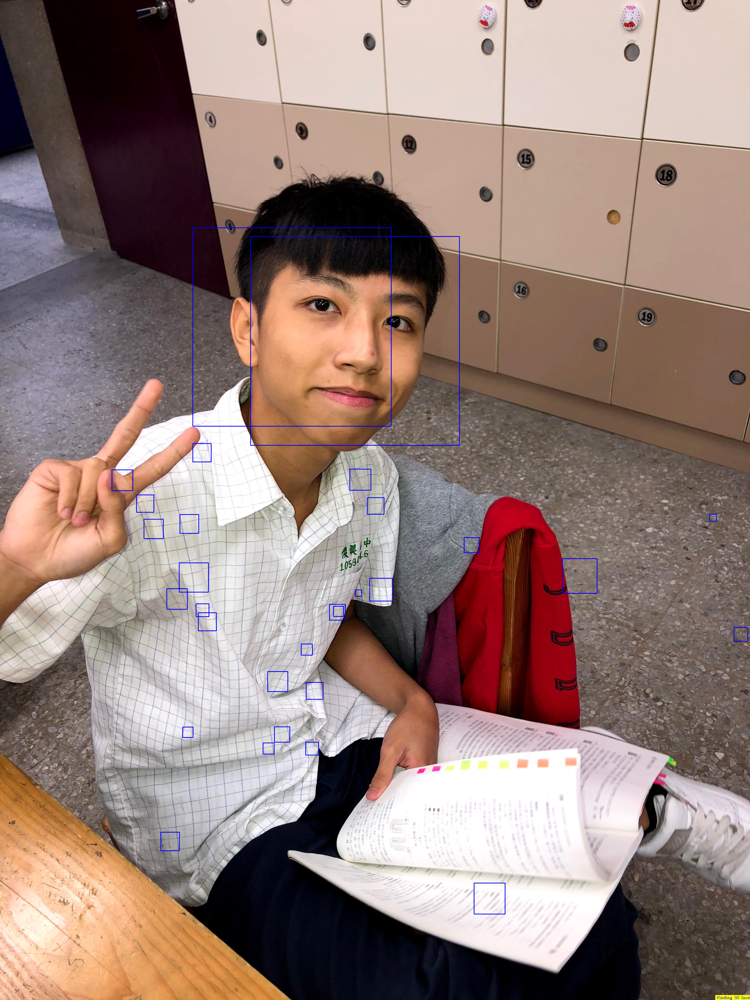

In [6]:
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow
pictPath=r'haarcascade_frontalface_default.xml'
face_cascade=cv2.CascadeClassifier(pictPath)
print(type(face_cascade))
# 建立辨識檔案物件
img=cv2.imread("mask55.JPG")

# 讀取影像檔案建立影像檔案物件
faces =face_cascade.detectMultiScale(img,scaleFactor=1.1,minNeighbors=3,minSize=(20,20))

# 標註右下角底色是黃色
cv2.rectangle(img,(img.shape[1]-140,img.shape[0]-20),(img.shape[1],img.shape[0]),(0,255,255),-1)
# 標註找到多少的人臉
cv2.putText(img,"Finding "+str(len(faces))+" face",(img.shape[1]-135,img.shape[0]-5),cv2.FONT_HERSHEY_COMPLEX,0.5,(255,0,0),1)
# 將人臉框起來, 由於有可能找到好幾個臉所以用迴圈繪出來
for(x,y,w,h) in faces:
  cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
# 藍色框住人臉
cv2_imshow(img)


# dlib 

---




*   是一套簡便的人臉辨識模組，比上者能更佳精準


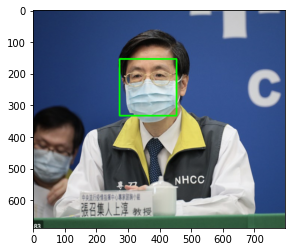

In [49]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import dlib
import matplotlib.pyplot as plt

detector = dlib.get_frontal_face_detector()
img = cv2.imread("mask12.png")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
frame = img
face_rects, scores, idx = detector.run(frame, 0)
for face in face_rects:
    # 取得左上角的座標、右下角座標
    x1 = face.left()
    y1 = face.top()
    x2 = face.right()
    y2 = face.bottom()
    # 畫出來
    cv2.rectangle(img, (x1, y1), (x2, y2), (0,255, 0), 4,cv2.LINE_AA)
    # 印出來
plt.imshow(img)
plt.show()

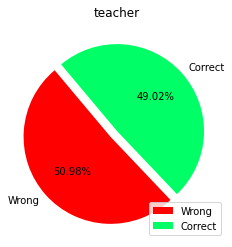

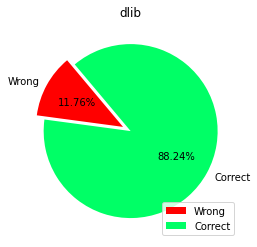

In [50]:
import matplotlib.pyplot as plt
sorts =["Wrong","Correct"]
fee =[26,25]
plt.pie(fee,labels=sorts,explode=(0.1,0),colors=((1,0,0),(0,1,0.4))
  ,autopct="%1.2f%%",startangle=130)# 繪製圓餅圖
plt.title("teacher")
plt.legend(loc=4)
plt.show()
import matplotlib.pyplot as plt
sorts =["Wrong","Correct"]
fee =[6,45]
plt.pie(fee,labels=sorts,explode=(0.1,0),colors=((1,0,0),(0,1,0.4))
  ,autopct="%1.2f%%",startangle=130)# 繪製圓餅圖
plt.title("dlib")
plt.legend(loc=4)
plt.show()

In [56]:
from PIL import Image 
import cv2

while x1<0:
    x1+=10

while y1<0:
    y1+=10

x_max = img.shape[1]
y_max = img.shape[0]

while x2 > x_max:
    x2-=10
while y2 > y_max:
    y2-=10

# 分成上臉及下臉 來做顏色統計圖

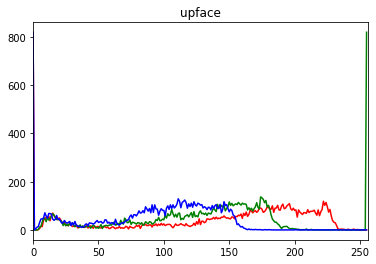

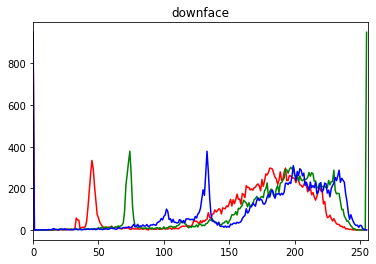

In [57]:
faceLong = y2-y1
upface = img[y1:y1+int(1/3*faceLong),x1:x2]
downface = img[y1+int(1/3*faceLong):y2,x1:x2]
color = ('r','g','b')
for i, col in enumerate(color):
    histr = cv2.calcHist([upface],[i],None,[256],[0, 256])
    plt.plot(histr, color = col)
    plt.xlim([0, 256])
plt.title("upface")
plt.show()
for i, col in enumerate(color):
    histr = cv2.calcHist([downface],[i],None,[256],[0, 256])
    plt.plot(histr, color = col)
    plt.xlim([0, 256])
plt.title("downface")
plt.show()

# 判斷相似度

0.544336023364022
無法判斷


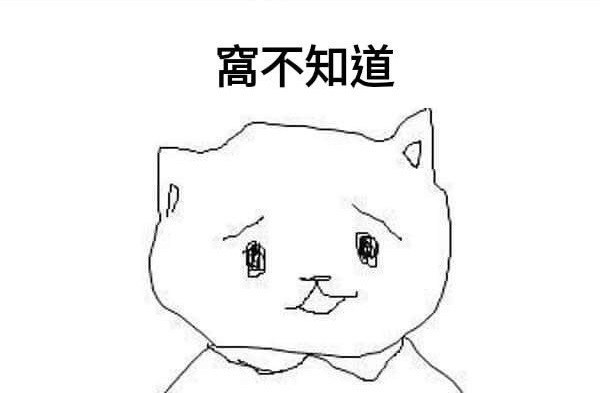

In [58]:
import model3 #引用自定義模組model3
hist1 = cv2.calcHist([upface], [0,1,2], None, [64, 64,64], [0, 256, 0, 256,0, 256])
# 平移縮放
cv2.normalize(hist1, hist1, 0, 1.0, cv2.NORM_MINMAX)
hist2 = cv2.calcHist([downface], [0,1,2], None, [64,64,64], [0, 256, 0, 256,0, 256])
cv2.normalize(hist2, hist2, 0, 1.0, cv2.NORM_MINMAX)
# 比較方法 HISTCMP_CORREL (相關姓) 0、HISTCMP_CHISQR (卡方) 1、HISTCMP_BHATTACHARYYA(巴式) 2
near = cv2.compareHist(hist1,hist2,0)
print(near)

model3.detect(near)

# 縮小照片擷取範圍，以減少背景帶來的誤差值


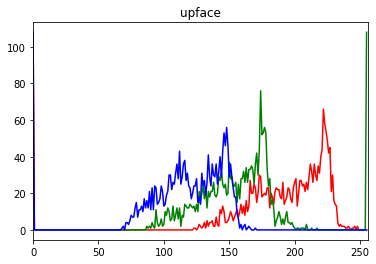

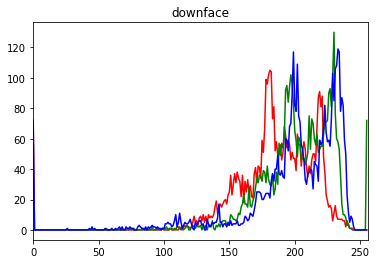

In [59]:
faceLong = y2-y1
upface = img[y1:y1+int(1/3*faceLong),x1+int(int(x2-x1)/2.5):x2-int(int(x2-x1)/2.5)]
downface = img[y1+int(1/3*faceLong):y2,x1+int(int(x2-x1)/2.5):x2-int(int(x2-x1)/2.5)]
color = ('r','g','b')
for i, col in enumerate(color):
    histr = cv2.calcHist([upface],[i],None,[256],[0, 256])
    plt.plot(histr, color = col)
    plt.xlim([0, 256])
plt.title("upface")
plt.show()
for i, col in enumerate(color):
    histr = cv2.calcHist([downface],[i],None,[256],[0, 256])
    plt.plot(histr, color = col)
    plt.xlim([0, 256])
plt.title("downface")
plt.show()

#重新判斷相似度

0.0788577682349267
有戴口罩


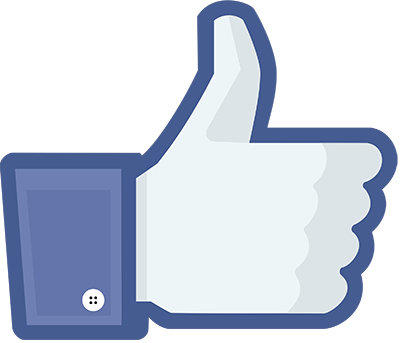

In [60]:
import model3
hist1 = cv2.calcHist([upface], [0,1,2], None, [64, 64,64], [0, 256, 0, 256,0, 256])
# 平移縮放
cv2.normalize(hist1, hist1, 0, 1.0, cv2.NORM_MINMAX)
hist2 = cv2.calcHist([downface], [0,1,2], None, [64,64,64], [0, 256, 0, 256,0, 256])
cv2.normalize(hist2, hist2, 0, 1.0, cv2.NORM_MINMAX)
# 比較方法 HISTCMP_CORREL (相關姓) 0、HISTCMP_CHISQR (卡方) 1、HISTCMP_BHATTACHARYYA(巴式) 2
near = cv2.compareHist(hist1,hist2,0)
print(near)

model3.detect(near)

In [61]:
import sqlite3
import xlrd

# 建立数据库
def createDataBase():
   cn = sqlite3.connect('data.db')

   cn.execute('''CREATE TABLE IF NOT EXISTS TB_STUDENTS
         (YN,
         RE);''')

   cn.commit()
   cn.close()

# 解析excel文件并将其存储到sqlite
def readExcel(filename, cn):
   # 读取
   workbook = xlrd.open_workbook(filename)
   # 获取sheet
   sheet_name = workbook.sheet_names()[0]
   sheet = workbook.sheet_by_name(sheet_name)

   for i in range(1, sheet.nrows):
      temp = []
      for j in range(0, sheet.ncols):
         temp.append(sheet.cell(i, j).value)

      cn.execute("insert into TB_STUDENTS (YN, RE) "
                 "values('%s','%s')"
                 % (temp[0], temp[1]))

      #itemCount = itemCount + 1
      #if itemCount != 0:
      cn.commit()
      cn.close

#使用上面的两个函数
def importData(path):
   createDataBase()
   database = sqlite3.connect("data.db")
   readExcel(path, database)

def show( filename):
   conn = sqlite3.connect( filename)
   c = conn.cursor()
   print("\nThe %s information is as follows:" % filename)

   cursor = c.execute("SELECT YN, RE from TB_STUDENTS")
   for row in cursor:
      print("YN = ", row[0])
      print("RE = ", row[1])

   print("\n\t\tEND")
   conn.close()

path = input("Please enter the excel file's name:")
importData(path)
show("data.db")

Please enter the excel file's name:python.xlsx

The data.db information is as follows:
YN =  O
RE =  -0.069322200119
YN =  O
RE =  0.013219992021
YN =  O
RE =  0.0029048398563
YN =  O
RE =  0.012908779345
YN =  O
RE =  0.0111894930275
YN =  O
RE =  0.0348092901109
YN =  O
RE =  0.0128093759398
YN =  O
RE =  0.0402046345085661
YN =  O
RE =  0.0103489205661
YN =  O
RE =  0.013454432261
YN =  O
RE =  0.0248937892212
YN =  O
RE =  0.0109998378221
YN =  O
RE =  -0.015214633442215
YN =  O
RE =  0.0123909224467766
YN =  O
RE =  0.012455085661
YN =  O
RE =  0.043675085978
YN =  O
RE =  0.0202046345085896
YN =  O
RE =  0.03289355661
YN =  O
RE =  0.013459045651
YN =  O
RE =  0.011124045632
YN =  O
RE =  0.011589030042
YN =  O
RE =  0.010895832289
YN =  O
RE =  0.0149283488802
YN =  O
RE =  0.0112044320475
YN =  O
RE =  0.002430985661
YN =  O
RE =  0.020985085661
YN =  O
RE =  0.012003245085661
YN =  O
RE =  0.010201313085661
YN =  O
RE =  0.0133989025661
YN =  O
RE =  0.0324234555661
YN =  O
RE

In [64]:
import sqlite3
import xlrd

# 建立数据库
def createDataBase():
   cn = sqlite3.connect('data2.db')

   cn.execute('''CREATE TABLE IF NOT EXISTS TB_STUDENTS
         (YN,
         RE);''')

   cn.commit()
   cn.close()

# 解析excel文件并将其存储到sqlite
def readExcel(filename, cn):
   # 读取
   workbook = xlrd.open_workbook(filename)
   # 获取sheet
   sheet_name = workbook.sheet_names()[0]
   sheet = workbook.sheet_by_name(sheet_name)

   for i in range(1, sheet.nrows):
      temp = []
      for j in range(0, sheet.ncols):
         temp.append(sheet.cell(i, j).value)

      cn.execute("insert into TB_STUDENTS (YN, RE) "
                 "values('%s','%s')"
                 % (temp[0], temp[1]))

      #itemCount = itemCount + 1
      #if itemCount != 0:
      cn.commit()
      cn.close

#使用上面的两个函数
def importData(path):
   createDataBase()
   database = sqlite3.connect("data2.db")
   readExcel(path, database)

#显示学生名单里的信息
def show( filename):
   conn = sqlite3.connect( filename)
   c = conn.cursor()
   print("\nThe %s information is as follows:" % filename)

   cursor = c.execute("SELECT YN, RE from TB_STUDENTS")
   for row in cursor:
      print("YN = ", row[0])
      print("RE = ", row[1])

   print("\n\t\tEND")
   conn.close()

path = input("Please enter the excel file's name:")
importData(path)
show("data2.db")

Please enter the excel file's name:python_after.xlsx

The data2.db information is as follows:
YN =  O
RE =  -0.069322200119
YN =  O
RE =  0.013219992021
YN =  O
RE =  0.0029048398563
YN =  O
RE =  0.012908779345
YN =  O
RE =  0.0111894930275
YN =  O
RE =  0.0348092901109
YN =  O
RE =  0.0128093759398
YN =  O
RE =  0.0402046345085661
YN =  O
RE =  0.0103489205661
YN =  O
RE =  0.013454432261
YN =  O
RE =  0.0248937892212
YN =  O
RE =  0.0109998378221
YN =  O
RE =  -0.015214633442215
YN =  O
RE =  0.0123909224467766
YN =  O
RE =  0.012455085661
YN =  O
RE =  0.043675085978
YN =  O
RE =  0.0202046345085896
YN =  O
RE =  0.03289355661
YN =  O
RE =  0.013459045651
YN =  O
RE =  0.011124045632
YN =  O
RE =  0.011589030042
YN =  O
RE =  0.010895832289
YN =  O
RE =  0.0149283488802
YN =  O
RE =  0.0112044320475
YN =  O
RE =  0.002430985661
YN =  O
RE =  0.020985085661
YN =  O
RE =  0.012003245085661
YN =  O
RE =  0.010201313085661
YN =  O
RE =  0.0133989025661
YN =  O
RE =  0.0324234555661
YN 

#從DB抓資料做成點陣圖


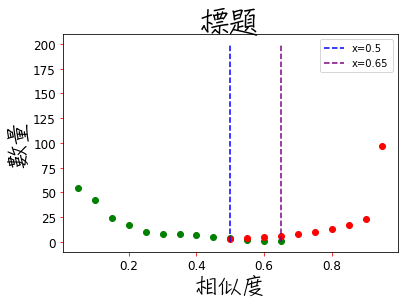

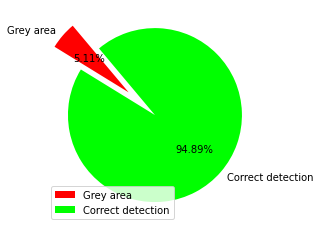

In [63]:
def SQL_to_Colab():
  import sqlite3
  import matplotlib.pyplot as plt
  from matplotlib.font_manager import FontProperties
  conn =sqlite3.connect("data.db")# 資料庫連線
  result1 = conn.execute("SELECT RE from TB_STUDENTS where YN = 'O'")
  result2 = conn.execute("SELECT RE from TB_STUDENTS where YN = 'X'")
  have_mask_precisions = result1.fetchall()
  Nhave_mask_precisions = result2.fetchall()# 結果轉成元素是元組的串列
  have_mask_sum_arr =[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
  Nhave_mask_sum_arr = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
  seq1 = []
  #initial seq-------------
  for i in range(0,20):
    seq1.append(i*0.05)
  #----------------------
  seq2 = []
  #initial seq-------------
  for i in range(0,20):
    seq2.append(i*0.05)
  #------------------------
  #設定 have_mask_sum_arr-- 有戴口罩的
  for have_mask_precision in have_mask_precisions:
    for i in range(0,20):
      if (float(have_mask_precision[0]) <= 0.05 * i):
        index = i
        break
    have_mask_sum_arr[i] += 1
  #-----------------------------
  #設定 Nhave_mask_sum_arr-- 沒戴口罩的
  for Nhave_mask_precision in Nhave_mask_precisions:
    for i in range(0,20):
      if (float(Nhave_mask_precision[0]) <= 0.05 * i):
        index = i
        break
    Nhave_mask_sum_arr[i] += 1
  #-----------------------------
  #正德老大的要求
  for i in range(19,-1,-1):
    if (have_mask_sum_arr[i] == 0):
      del have_mask_sum_arr[i]
      del seq1[i]
  for i in range(19,-1,-1):
    if (Nhave_mask_sum_arr[i] == 0):
      del Nhave_mask_sum_arr[i]
      del seq2[i]

  del have_mask_sum_arr[0]
  del seq1[0]
  del Nhave_mask_sum_arr[0]
  del seq2[0]
  
  #-----------------------------
  plt.scatter(seq1, have_mask_sum_arr, color = 'green') 
  plt.scatter(seq2, Nhave_mask_sum_arr, color = 'red')
  font_title = FontProperties(fname=r"竹風體W4.ttc", size=30)
  font_subtitle = FontProperties(fname=r"竹風體W4.ttc", size=24)
  plt.title("標題", fontproperties= font_title)
  plt.xlabel("相似度",fontsize = 24, fontproperties = font_subtitle)
  plt.ylabel("數量", fontsize = 24, fontproperties= font_subtitle)
  plt.tick_params(axis='both',labelsize=12,color='red')
  #---------------------------第一條線
  for i in range(0,len(seq1)):
    delta = False
    for j in range(0,len(seq2)):
      if (seq1[i] == seq2[j] and have_mask_sum_arr[i] >0 and Nhave_mask_sum_arr[j]>0):
        plt.plot([seq1[i],seq1[i]],[0,200], linestyle = '--', color = "blue", label= "x="+str(seq1[i]))
        delta = True #表有劃過線了
    if (delta): #if有劃過線 再跳出去一次
      break
  #---------------------------第二條線
  for i in range(len(seq1)-1,-1,-1):
    delta = False
    for j in range(len(seq2)-1,-1,-1):
      if (seq1[i] == seq2[j] and have_mask_sum_arr[i] >0 and Nhave_mask_sum_arr[j]>0):
        plt.plot([seq1[i],seq1[i]],[0,200], linestyle = '--', color = "purple", label = "x=" + str(seq1[i]))
        delta = True #表有劃過線了
    if (delta): #if有劃過線 再跳出去一次
      break
  plt.legend(loc="best")
  plt.show()
  #---------------------------
  sorts =["Grey area","Correct detection"]
  result3 = conn.execute("SELECT RE from TB_STUDENTS")
  set_REs = result3.fetchall()
  RE_arr = []
  for set_RE in set_REs:
    RE_arr.append(float(set_RE[0]))
  #print(RE_arr)
  grayCount = 0
  correctCount = 0
  
  for re in RE_arr:
    if re >= 0.5 and re <= 0.65:
      grayCount+=1
    else:
      correctCount+=1
  sorts =["Grey area","Correct detection"]
  fee =[grayCount,correctCount]
  plt.pie(fee,labels=sorts,explode=(0.4,0),colors=((1,0,0),(0,1,0))
    ,autopct="%1.2f%%",startangle=130)# 繪製圓餅圖
  plt.legend(loc=3)
  plt.show()

  #-----------------------------
  #葉老闆的需求
  #have_mask_precisions [(item, ),(item, )]
  #Nhave_mask_precisions  [(item, ),(item, )
  have_mask_arr_in_range = []
  Nhave_mask_arr_in_range = [] #range 在 0.5 ~ 0.65
  for have_mask_precision_set in  have_mask_precisions:
    RE_data = float(have_mask_precision_set[0])
    if (RE_data<=0.65 and RE_data>=0.5):
      have_mask_arr_in_range.append(RE_data)
  for Nhave_mask_precision_set in  Nhave_mask_precisions:
    RE_data = float(Nhave_mask_precision_set[0])
    if (RE_data<=0.65 and RE_data>=0.5):
      Nhave_mask_arr_in_range.append(RE_data)
  #print(have_mask_arr_in_range)
  #print(Nhave_mask_arr_in_range)
  #have_mask_arr_in_range 是 在0.5~0.65之間且有戴口罩的相似度array
  #Nhave_mask_arr_in_range 是 在0.5~0.65之間且沒戴口罩的相似度array
  
  #-----------------------------
  #print(have_mask_sum_arr)
  #print(Nhave_mask_sum_arr)
  #plt.scatter(seq1, have_mask_sum_arr, color = 'green') 
  #plt.scatter(seq2, Nhave_mask_sum_arr, color = 'red')
  #font_title = FontProperties(fname=r"竹風體W4.ttc", size=30)
  #font_subtitle = FontProperties(fname=r"竹風體W4.ttc", size=24)
  #plt.title("標題", fontproperties= font_title)
  #plt.xlabel("相似度",fontsize = 24, fontproperties = font_subtitle)
  #plt.ylabel("數量", fontsize = 24, fontproperties= font_subtitle)
  #plt.tick_params(axis='both',labelsize=12,color='red')
  
  #-----------------------------
  conn.close()# 關閉資料庫連線

  


SQL_to_Colab()





#修正模糊

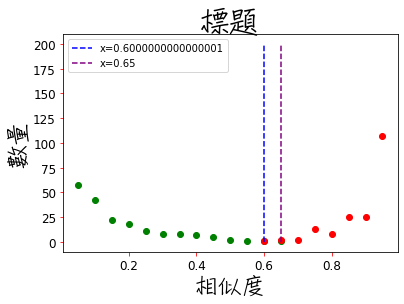

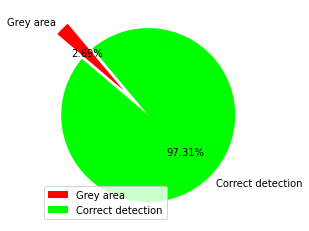

In [65]:
def SQL_to_Colab():
  import sqlite3
  import matplotlib.pyplot as plt
  from matplotlib.font_manager import FontProperties
  conn =sqlite3.connect("data2.db")# 資料庫連線
  result1 = conn.execute("SELECT RE from TB_STUDENTS where YN = 'O'")
  result2 = conn.execute("SELECT RE from TB_STUDENTS where YN = 'X'")
  have_mask_precisions = result1.fetchall()
  Nhave_mask_precisions = result2.fetchall()# 結果轉成元素是元組的串列
  have_mask_sum_arr2 =[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
  Nhave_mask_sum_arr2 = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
  seq1 = []
  #initial seq-------------
  for i in range(0,20):
    seq1.append(i*0.05)
  #----------------------
  seq2 = []
  #initial seq-------------
  for i in range(0,20):
    seq2.append(i*0.05)
  #------------------------
  #設定 have_mask_sum_arr--
  for have_mask_precision in have_mask_precisions:
    for i in range(0,20):
      if (float(have_mask_precision[0]) <= 0.05 * i):
        index = i
        break
    have_mask_sum_arr2[i] += 1
  #-----------------------------
  #設定 Nhave_mask_sum_arr--
  for Nhave_mask_precision in Nhave_mask_precisions:
    for i in range(0,20):
      if (float(Nhave_mask_precision[0]) <= 0.05 * i):
        index = i
        break
    Nhave_mask_sum_arr2[i] += 1
  #-----------------------------
  #正德老大的要求
  for i in range(19,-1,-1):
    if (have_mask_sum_arr2[i] == 0):
      del have_mask_sum_arr2[i]
      del seq1[i]
  for i in range(19,-1,-1):
    if (Nhave_mask_sum_arr2[i] == 0):
      del Nhave_mask_sum_arr2[i]
      del seq2[i]

  del have_mask_sum_arr2[0]
  del seq1[0]
  del Nhave_mask_sum_arr2[0]
  del seq2[0]
  
  #-----------------------------
  plt.scatter(seq1, have_mask_sum_arr2, color = 'green') 
  plt.scatter(seq2, Nhave_mask_sum_arr2, color = 'red')
  font_title = FontProperties(fname=r"竹風體W4.ttc", size=30)
  font_subtitle = FontProperties(fname=r"竹風體W4.ttc", size=24)
  plt.title("標題", fontproperties= font_title)
  plt.xlabel("相似度",fontsize = 24, fontproperties = font_subtitle)
  plt.ylabel("數量", fontsize = 24, fontproperties= font_subtitle)
  plt.tick_params(axis='both',labelsize=12,color='red')
  #---------------------------第一條線
  for i in range(0,len(seq1)):
    delta = False
    for j in range(0,len(seq2)):
      if (seq1[i] == seq2[j] and have_mask_sum_arr2[i] >0 and Nhave_mask_sum_arr2[j]>0):
        plt.plot([seq1[i],seq1[i]],[0,200], linestyle = '--', color = "blue", label= "x="+str(seq1[i]))
        delta = True #表有劃過線了
    if (delta): #if有劃過線 再跳出去一次
      break
  #---------------------------第二條線
  for i in range(len(seq1)-1,-1,-1):
    delta = False
    for j in range(len(seq2)-1,-1,-1):
      if (seq1[i] == seq2[j] and have_mask_sum_arr2[i] >0 and Nhave_mask_sum_arr2[j]>0):
        plt.plot([seq1[i],seq1[i]],[0,200], linestyle = '--', color = "purple", label = "x=" + str(seq1[i]))
        delta = True #表有劃過線了
    if (delta): #if有劃過線 再跳出去一次
      break
  plt.legend(loc="best")
  plt.show()
  #---------------------------
  sorts =["Grey area","Correct detection"]
  result3 = conn.execute("SELECT RE from TB_STUDENTS")
  set_REs = result3.fetchall()
  RE_arr = []
  for set_RE in set_REs:
    RE_arr.append(float(set_RE[0]))
  #print(RE_arr)
  grayCount = 0
  correctCount = 0
  
  for re in RE_arr:
    if re >= 0.5 and re <= 0.65:
      grayCount+=1
    else:
      correctCount+=1
  sorts =["Grey area","Correct detection"]
  fee =[grayCount,correctCount]
  plt.pie(fee,labels=sorts,explode=(0.4,0),colors=((1,0,0),(0,1,0))
    ,autopct="%1.2f%%",startangle=130)# 繪製圓餅圖
  plt.legend(loc=3)
  plt.show()

  #-----------------------------
  #葉老闆的需求
  #have_mask_precisions [(item, ),(item, )]
  #Nhave_mask_precisions  [(item, ),(item, )
  have_mask_arr_in_range = []
  Nhave_mask_arr_in_range = [] #range 在 0.5 ~ 0.65
  for have_mask_precision_set in  have_mask_precisions:
    RE_data = float(have_mask_precision_set[0])
    if (RE_data<=0.65 and RE_data>=0.5):
      have_mask_arr_in_range.append(RE_data)
  for Nhave_mask_precision_set in  Nhave_mask_precisions:
    RE_data = float(Nhave_mask_precision_set[0])
    if (RE_data<=0.65 and RE_data>=0.5):
      Nhave_mask_arr_in_range.append(RE_data)
  #print(have_mask_arr_in_range)
  #print(Nhave_mask_arr_in_range)
  #have_mask_arr_in_range 是 在0.5~0.65之間且有戴口罩的相似度array
  #Nhave_mask_arr_in_range 是 在0.5~0.65之間且沒戴口罩的相似度array
  
  #-----------------------------
  #print(have_mask_sum_arr)
  #print(Nhave_mask_sum_arr)
  #plt.scatter(seq1, have_mask_sum_arr, color = 'green') 
  #plt.scatter(seq2, Nhave_mask_sum_arr, color = 'red')
  #font_title = FontProperties(fname=r"竹風體W4.ttc", size=30)
  #font_subtitle = FontProperties(fname=r"竹風體W4.ttc", size=24)
  #plt.title("標題", fontproperties= font_title)
  #plt.xlabel("相似度",fontsize = 24, fontproperties = font_subtitle)
  #plt.ylabel("數量", fontsize = 24, fontproperties= font_subtitle)
  #plt.tick_params(axis='both',labelsize=12,color='red')
  
  #-----------------------------
  conn.close()# 關閉資料庫連線

  


SQL_to_Colab()





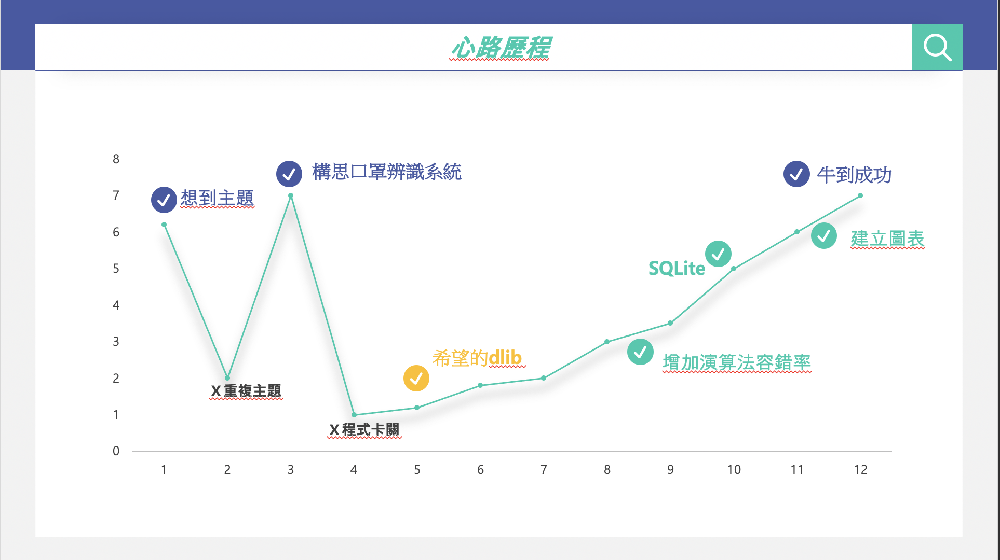

In [ ]:
from PIL import Image
pict = Image.open("ppt5.png")
pict

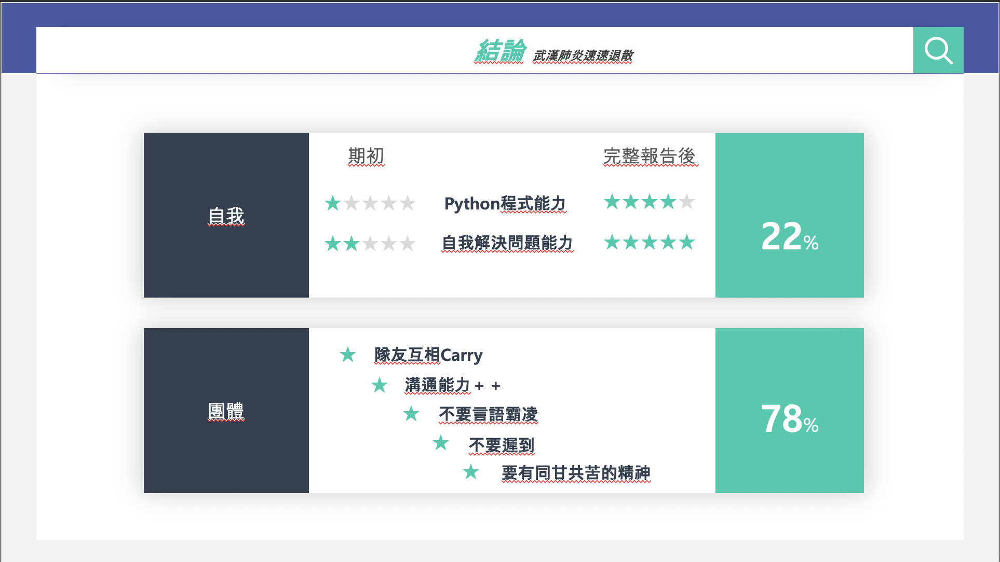

In [ ]:
from PIL import Image
pict = Image.open("ppt6.png")
pict

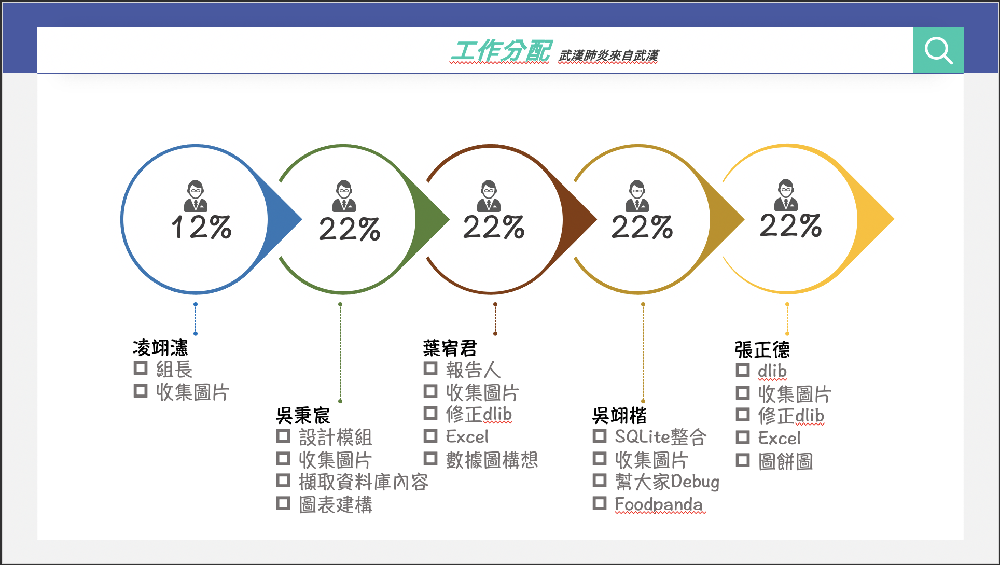

In [ ]:
from PIL import Image
pict = Image.open("ppt7.png")
pict